## Data Loading & Setup

### Feature Analysis

#### Danceability
Describes how suitable a track is for dancing based on a combination of musical elements including tempo, rhythm stability, beat strength, and overall regularity. A value of 0.0 is least danceable and 1.0 is most danceable.

#### Energy
A perceptual measure of intensity and activity. Energetic tracks feel fast, loud, and noisy. For example, death metal has high energy, while a Bach prelude scores low. Features contributing to energy include dynamic range, perceived loudness, timbre, onset rate, and general entropy.

#### Key
The key the track is in, represented as an integer using standard Pitch Class notation (0 = C, 1 = C♯/D♭, 2 = D, etc.). A value of -1 indicates no key was detected.

#### Loudness
The overall loudness of a track in decibels (dB), averaged across the entire track. Loudness values typically range between -60 and 0 dB, and are useful for comparing relative loudness across tracks.

#### Mode
Indicates the modality (major or minor) of a track. Major is represented by 1 and minor by 0.

#### Speechiness
Detects the presence of spoken words in a track. Values above 0.66 indicate tracks made almost entirely of spoken words (e.g. podcasts), values between 0.33 and 0.66 may contain both music and speech (e.g. rap), and values below 0.33 most likely represent instrumental music.

#### Acousticness
A confidence measure from 0.0 to 1.0 of whether the track is acoustic. A value of 1.0 represents high confidence the track is acoustic.

#### Instrumentalness
Predicts whether a track contains no vocals. "Ooh" and "aah" sounds are treated as instrumental. Rap or spoken word tracks are clearly vocal. The closer the value is to 1.0, the greater the likelihood the track contains no vocal content.

#### Liveness
Detects the presence of an audience in the recording. Higher liveness values represent an increased probability that the track was performed live. A value above 0.8 provides a strong likelihood the track is live.

#### Valence
A measure from 0.0 to 1.0 describing the musical positiveness conveyed by a track. Tracks with high valence sound more positive (happy, cheerful, euphoric), while tracks with low valence sound more negative (sad, depressed, angry).

#### Tempo
The overall estimated tempo of a track in beats per minute (BPM). Tempo is the speed or pace of a given piece and derives directly from the average beat duration.

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.preprocessing import StandardScaler
from pathlib import Path
import os

DATA_DIR = Path("../data/raw")

def load_all_artists(data_dir=DATA_DIR, genres_csv=DATA_DIR / "genres.csv"):
    """Load all artist CSVs from the data directory into a single DataFrame, skipping genres.csv.
    Joins genre information from genres.csv on artist name."""
    dfs = []
    for csv_file in sorted(data_dir.glob("*.csv")):
        if csv_file.name == "genres.csv":
            continue
        df = pd.read_csv(csv_file)
        dfs.append(df)
    combined = pd.concat(dfs, ignore_index=True)

    genres_df = pd.read_csv(genres_csv)
    genres_df["join_key"] = genres_df["artist_name"].str.lower()
    combined["join_key"] = combined["artist_name"].str.lower()
    combined = combined.merge(genres_df[["join_key", "genre"]], on="join_key", how="left")
    combined = combined.drop(columns="join_key").rename(columns={"genre": "genres"})

    return combined

def get_artist_averages(csv_path):
    """Return a Series containing the mean of each numerical column for a single artist CSV."""
    df = pd.read_csv(csv_path)
    return df.select_dtypes(include=np.number).mean()

In [2]:
edm = load_all_artists()
edm.head()

,track_name,track_id,artist_name,album_name,danceability,energy,key,loudness,mode,speechiness,acousticness,instrumentalness,liveness,valence,tempo,genres
0,On,4auxa3dOFI2A9NXoLlKt1c,1991,Odyssey,0.187,0.252,5,-8.697,1,0.0419,0.013000,0.507,0.472,0.580,131.975,NaN
1,Odyssey,50p5HLJgHhbIZX1n0WD7N2,1991,Odyssey,0.459,0.910,5,-3.508,0,0.0478,0.001300,0.896,0.149,0.312,173.953,NaN
2,Reloaded,2K8RNtp5JXglnBvkeCgaMN,1991,Odyssey,0.145,0.972,7,-3.193,1,0.1280,0.000372,0.210,0.144,0.554,63.996,NaN
3,Out Of My Head,6Q2tJt4oYeC6bbytXc5Z0R,1991,Odyssey,0.473,0.947,5,-4.849,1,0.0772,0.006230,0.788,0.258,0.331,173.998,NaN
4,Nothing Left To Lose,2UFTFZoIZg9WMspos6xiX9,1991,Odyssey,0.275,0.973,0,-4.189,1,0.0672,0.000031,0.750,0.320,0.137,115.089,NaN


In [3]:
artist_avgs = {}
for csv_file in sorted(DATA_DIR.glob("*.csv")):
    if csv_file.name == "genres.csv":
        continue
    artist_name = csv_file.stem.replace("_", " ")
    artist_avgs[artist_name] = get_artist_averages(csv_file)

edm_stats = pd.DataFrame(artist_avgs).T
edm_stats.index.name = "artist"
edm_stats.head()

,acousticness,artist_name,danceability,energy,instrumentalness,key,liveness,loudness,mode,speechiness,tempo,valence
artist,,,,,,,,,,,,
1991,0.018519,1991.0,0.513415,0.900400,0.490945,5.046154,0.217291,-3.365400,0.569231,0.074609,161.037554,0.358960
999999999,0.018466,999999999.0,0.637400,0.891360,0.852480,5.280000,0.149860,-9.048480,0.640000,0.066056,135.759160,0.261088
abana,0.029602,NaN,0.819125,0.855125,0.770000,6.125000,0.083388,-6.905625,0.500000,0.109613,126.383750,0.671125
above and beyond,0.214072,NaN,0.539813,0.630050,0.436409,5.231054,0.206270,-9.981311,0.475046,0.071803,125.371582,0.242765
adiel,0.064805,NaN,0.682682,0.721409,0.832045,4.909091,0.149514,-11.364545,0.772727,0.077886,136.582364,0.191259


## Exploratory Data Analysis

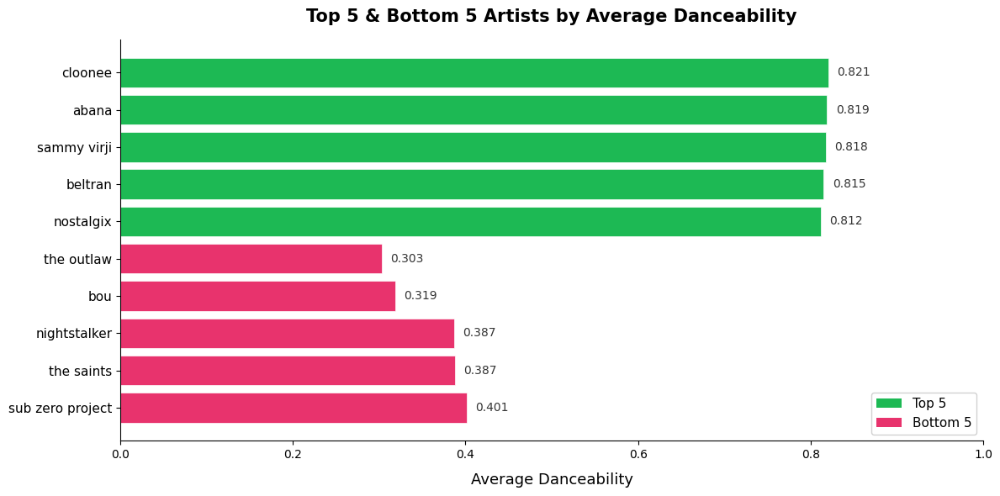

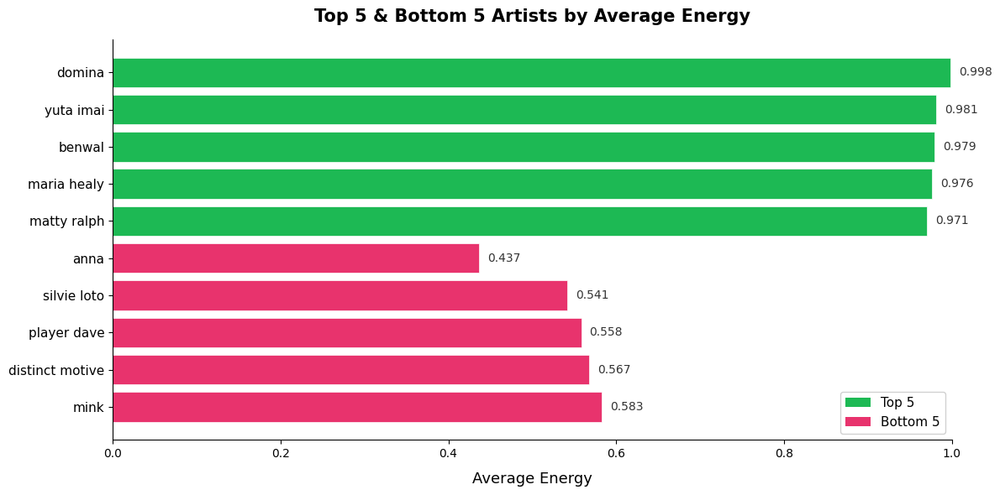

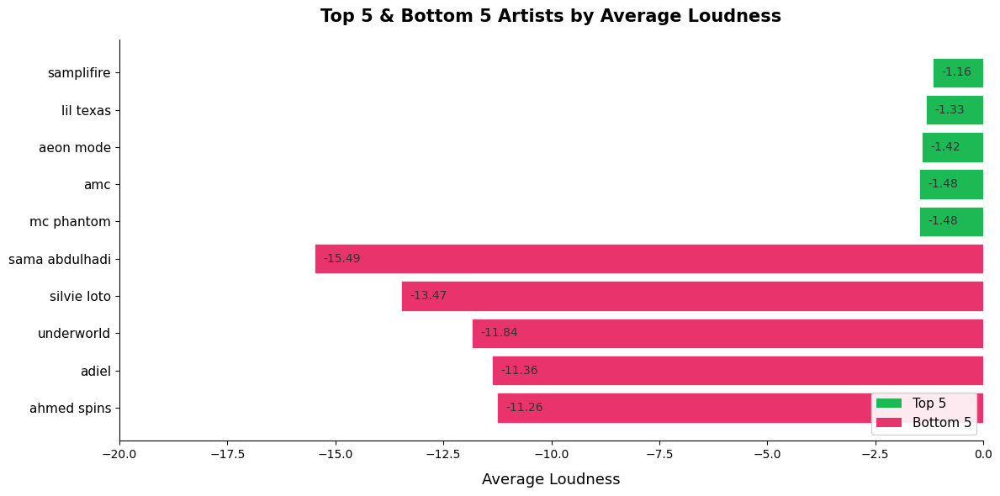

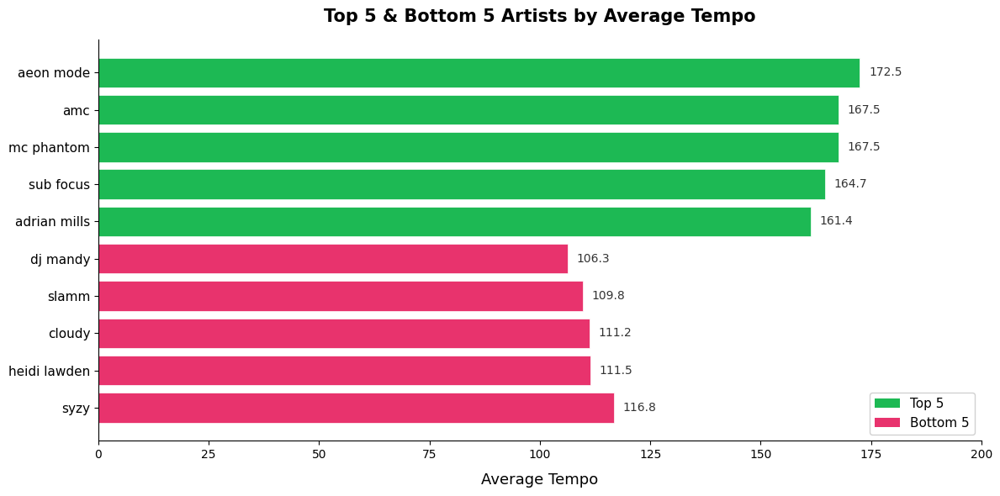

In [4]:
features = ["danceability", "energy", "loudness", "tempo"]
xlims = {"danceability": (0, 1), "energy": (0, 1), "loudness": (-20, 0), "tempo": (0, 200)}
formats = {"danceability": ".3f", "energy": ".3f", "loudness": ".2f", "tempo": ".1f"}

for feature in features:
    top5 = edm_stats[feature].nlargest(5)
    bottom5 = edm_stats[feature].nsmallest(5)

    artists = pd.concat([top5, bottom5])
    colors = ["#1db954"] * 5 + ["#e8336d"] * 5

    fig, ax = plt.subplots(figsize=(12, 6))
    bars = ax.barh(artists.index[::-1], artists.values[::-1], color=colors[::-1], edgecolor="white", linewidth=0.5)

    ax.set_xlabel(f"Average {feature.title()}", fontsize=13, labelpad=10)
    ax.set_title(f"Top 5 & Bottom 5 Artists by Average {feature.title()}", fontsize=15, fontweight="bold", pad=15)
    ax.set_xlim(xlims[feature])

    fmt = formats[feature]
    for bar in bars:
        width = bar.get_width()
        offset = (xlims[feature][1] - xlims[feature][0]) * 0.01
        ax.text(width + offset, bar.get_y() + bar.get_height() / 2, f"{width:{fmt}}",
                va="center", fontsize=10, color="#333333")

    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.tick_params(axis="y", labelsize=11)
    ax.tick_params(axis="x", labelsize=10)

    green_patch = plt.Rectangle((0, 0), 1, 1, fc="#1db954", label="Top 5")
    red_patch = plt.Rectangle((0, 0), 1, 1, fc="#e8336d", label="Bottom 5")
    ax.legend(handles=[green_patch, red_patch], loc="lower right", fontsize=11, framealpha=0.9)

    plt.tight_layout()
    plt.show()

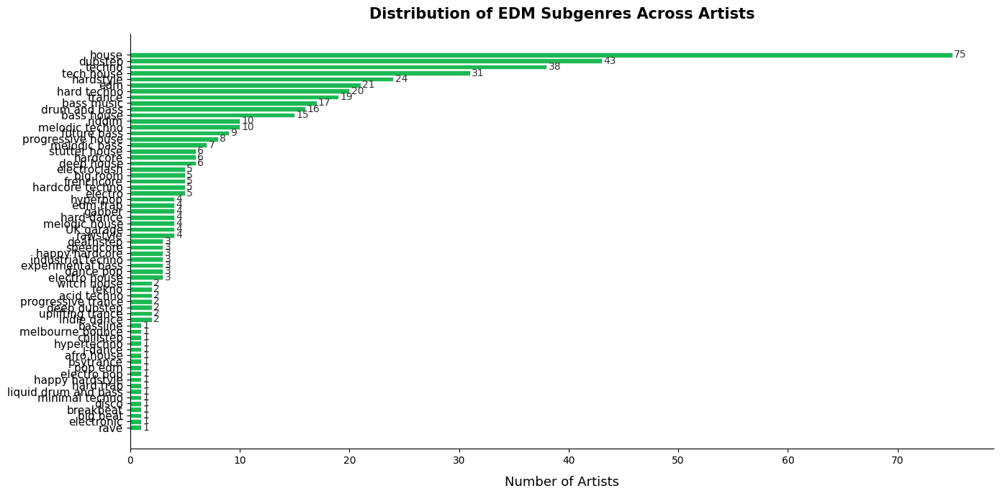

In [5]:
genres_df = pd.read_csv(DATA_DIR / "genres.csv")
genres_df = genres_df[genres_df["genre"].notna() & (genres_df["genre"] != "N/A")]

genre_counts = (
    genres_df["genre"]
    .str.split(", ")
    .explode()
    .str.strip()
    .value_counts()
)

fig, ax = plt.subplots(figsize=(14, 7))
bars = ax.barh(genre_counts.index[::-1], genre_counts.values[::-1], color="#1db954", edgecolor="white", linewidth=0.5)

for bar in bars:
    width = bar.get_width()
    ax.text(width + 0.15, bar.get_y() + bar.get_height() / 2, f"{int(width)}",
            va="center", fontsize=10, color="#333333")

ax.set_xlabel("Number of Artists", fontsize=13, labelpad=10)
ax.set_title("Distribution of EDM Subgenres Across Artists", fontsize=15, fontweight="bold", pad=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.tick_params(axis="y", labelsize=11)
ax.tick_params(axis="x", labelsize=10)

plt.tight_layout()
plt.show()

### Correlation Heatmap

Shows how audio features correlate with each other across all tracks. This is important for quantifying subgenres because highly correlated features (e.g. energy and loudness) carry redundant information. Before building a clustering model, we want to understand which features provide independent signal for separating subgenres and which ones move together. This also helps us decide if dimensionality reduction is needed.

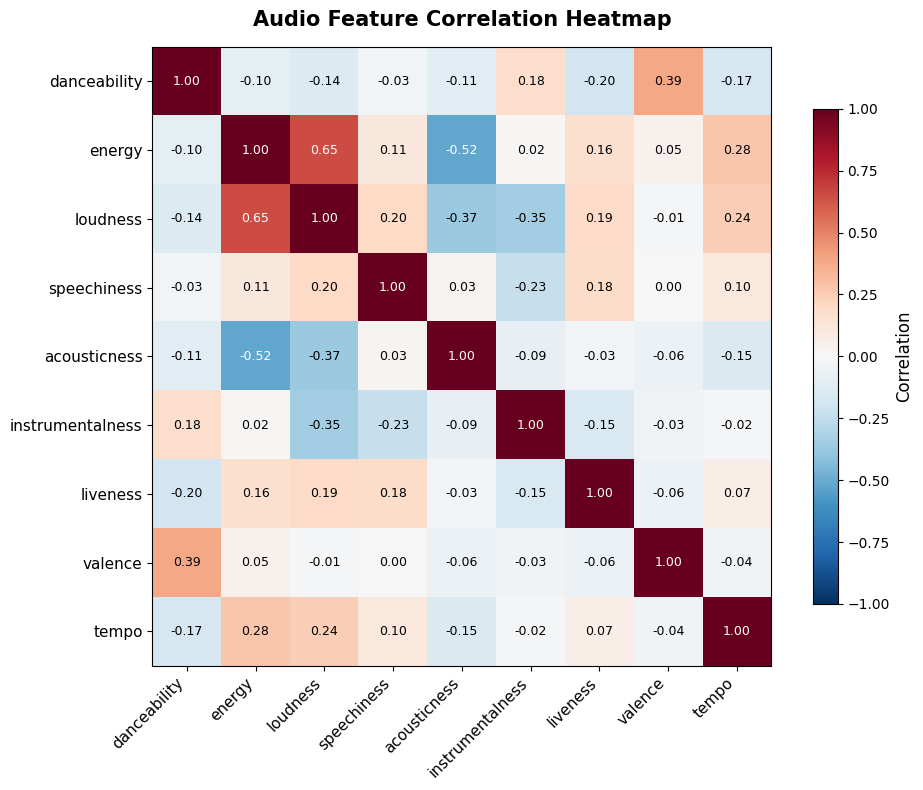

In [6]:
audio_features = ["danceability", "energy", "loudness", "speechiness",
                  "acousticness", "instrumentalness", "liveness", "valence", "tempo"]

corr = edm[audio_features].corr()

fig, ax = plt.subplots(figsize=(10, 8))
im = ax.imshow(corr, cmap="RdBu_r", vmin=-1, vmax=1)

ax.set_xticks(range(len(audio_features)))
ax.set_yticks(range(len(audio_features)))
ax.set_xticklabels(audio_features, rotation=45, ha="right", fontsize=11)
ax.set_yticklabels(audio_features, fontsize=11)

for i in range(len(audio_features)):
    for j in range(len(audio_features)):
        ax.text(j, i, f"{corr.iloc[i, j]:.2f}", ha="center", va="center",
                fontsize=9, color="white" if abs(corr.iloc[i, j]) > 0.5 else "black")

cbar = fig.colorbar(im, ax=ax, shrink=0.8)
cbar.set_label("Correlation", fontsize=12)
ax.set_title("Audio Feature Correlation Heatmap", fontsize=15, fontweight="bold", pad=15)

plt.tight_layout()
plt.show()

### Box Plots by Genre

Displays the distribution of each audio feature grouped by subgenre. This is the most direct way to see how subgenres differ in measurable terms. For example, if hardstyle tracks consistently cluster around 150 BPM with high energy while stutter house sits at 120-130 BPM with moderate energy, that tells us these features are strong discriminators. The spread of each box also reveals how "tight" a genre's definition is for a given feature.

/tmp/ipykernel_9998/3266106130.py:16: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data, labels=genre_order, patch_artist=True, vert=True)


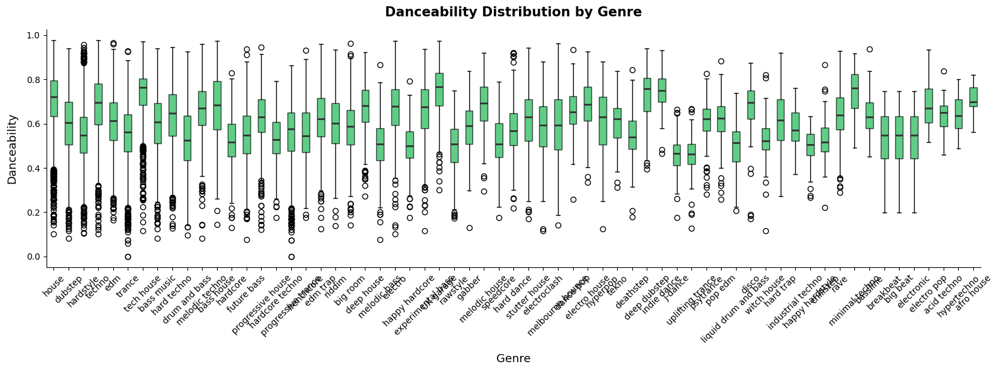

/tmp/ipykernel_9998/3266106130.py:16: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data, labels=genre_order, patch_artist=True, vert=True)


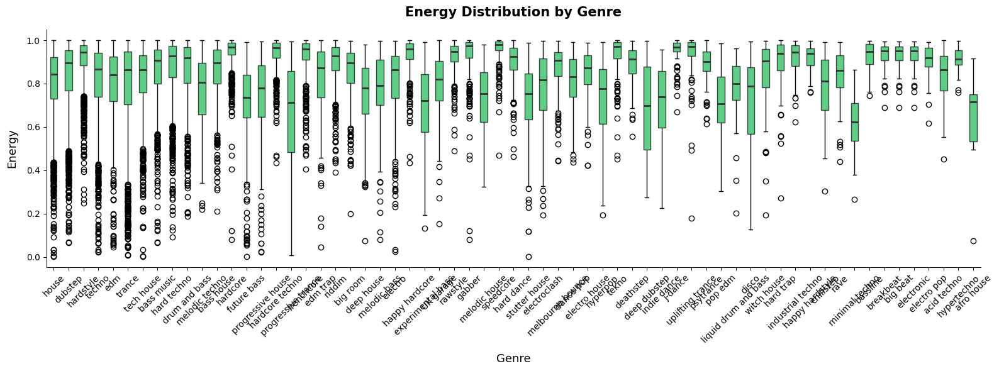

/tmp/ipykernel_9998/3266106130.py:16: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data, labels=genre_order, patch_artist=True, vert=True)


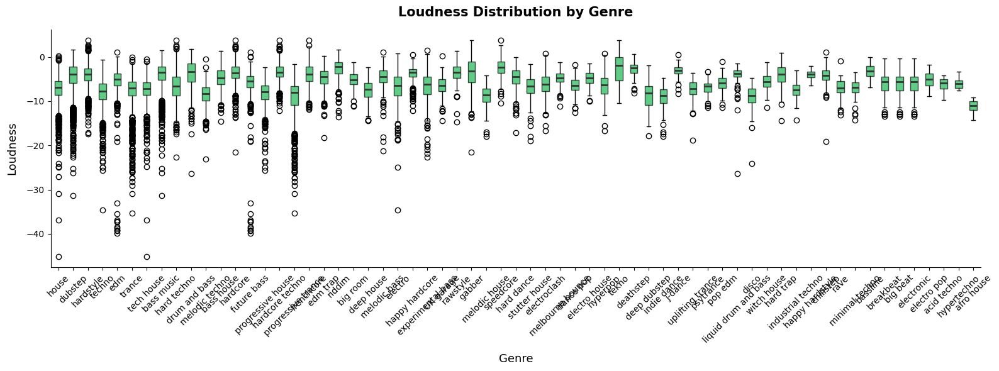

/tmp/ipykernel_9998/3266106130.py:16: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data, labels=genre_order, patch_artist=True, vert=True)


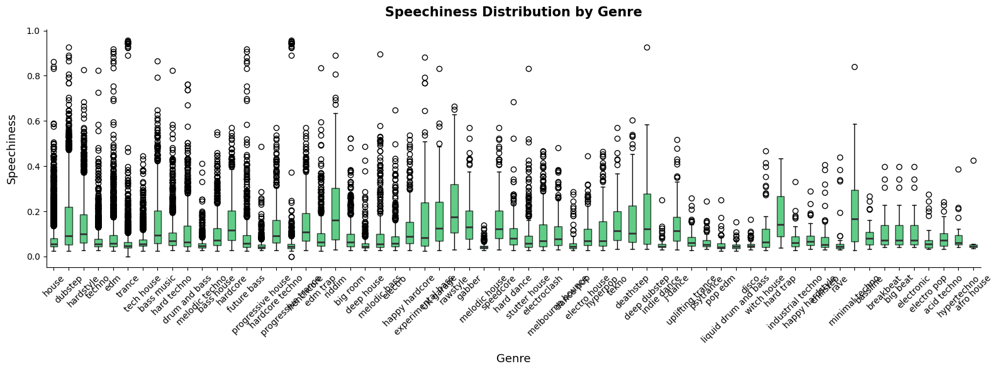

/tmp/ipykernel_9998/3266106130.py:16: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data, labels=genre_order, patch_artist=True, vert=True)


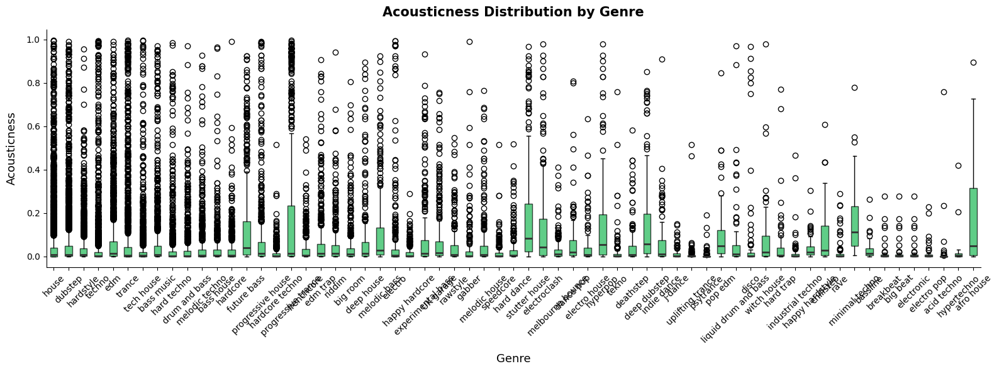

/tmp/ipykernel_9998/3266106130.py:16: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data, labels=genre_order, patch_artist=True, vert=True)


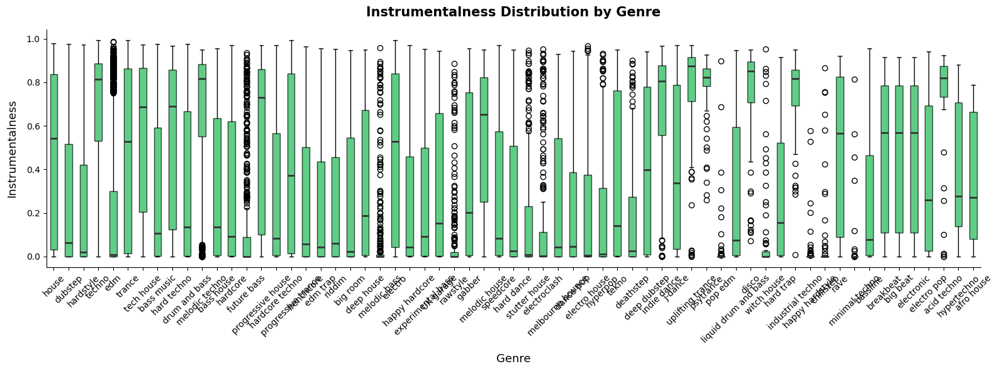

/tmp/ipykernel_9998/3266106130.py:16: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data, labels=genre_order, patch_artist=True, vert=True)


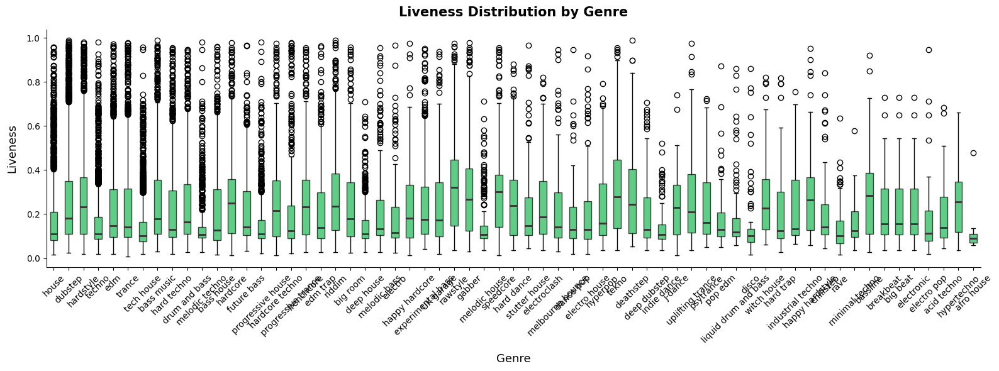

/tmp/ipykernel_9998/3266106130.py:16: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data, labels=genre_order, patch_artist=True, vert=True)


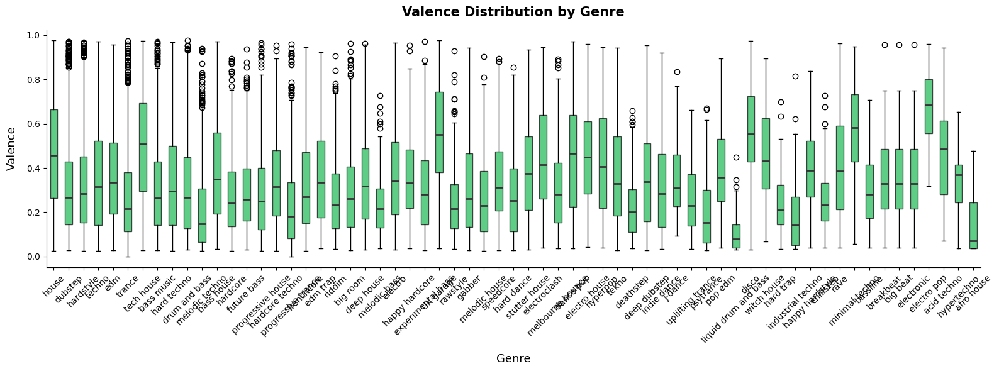

/tmp/ipykernel_9998/3266106130.py:16: MatplotlibDeprecationWarning: The 'labels' parameter of boxplot() has been renamed 'tick_labels' since Matplotlib 3.9; support for the old name will be dropped in 3.11.
  bp = ax.boxplot(data, labels=genre_order, patch_artist=True, vert=True)


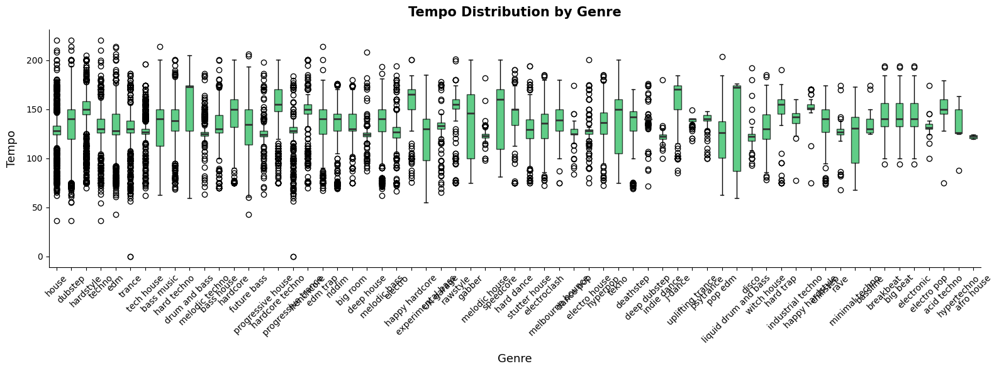

In [7]:
# Explode genres so each track appears once per genre it belongs to
edm_exploded = edm.dropna(subset=["genres"]).copy()
edm_exploded = edm_exploded[edm_exploded["genres"] != "N/A"]
edm_exploded["genre"] = edm_exploded["genres"].str.split(", ")
edm_exploded = edm_exploded.explode("genre")
edm_exploded["genre"] = edm_exploded["genre"].str.strip()

audio_features = ["danceability", "energy", "loudness", "speechiness",
                  "acousticness", "instrumentalness", "liveness", "valence", "tempo"]

genre_order = edm_exploded["genre"].value_counts().index.tolist()

for feature in audio_features:
    fig, ax = plt.subplots(figsize=(16, 6))
    data = [edm_exploded[edm_exploded["genre"] == g][feature].values for g in genre_order]
    bp = ax.boxplot(data, labels=genre_order, patch_artist=True, vert=True)

    for patch in bp["boxes"]:
        patch.set_facecolor("#1db954")
        patch.set_alpha(0.7)
    for median in bp["medians"]:
        median.set_color("#333333")
        median.set_linewidth(2)

    ax.set_xlabel("Genre", fontsize=13, labelpad=10)
    ax.set_ylabel(feature.title(), fontsize=13, labelpad=10)
    ax.set_title(f"{feature.title()} Distribution by Genre", fontsize=15, fontweight="bold", pad=15)
    ax.tick_params(axis="x", rotation=45, labelsize=10)
    ax.tick_params(axis="y", labelsize=10)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)

    plt.tight_layout()
    plt.show()

### Radar Charts by Genre

Visualizes the average audio feature profile of each subgenre as a radar (spider) chart. Each axis represents a normalized feature, and the resulting shape gives an intuitive fingerprint for what a genre "sounds like" numerically. If two genres have very different shapes, they should be easy to separate with clustering. If two genres have similar shapes, they may be harder to distinguish and might need more granular features.

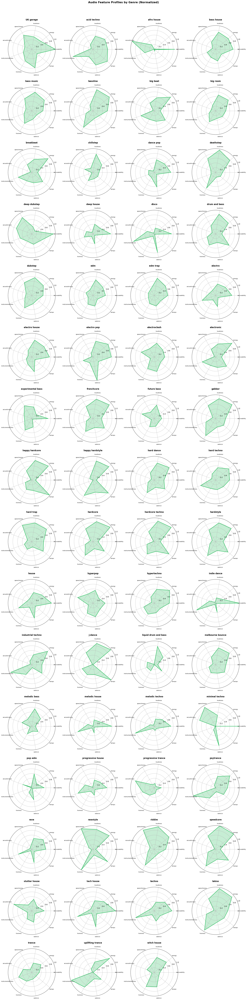

In [8]:
from sklearn.preprocessing import MinMaxScaler

audio_features = ["danceability", "energy", "loudness", "speechiness",
                  "acousticness", "instrumentalness", "liveness", "valence", "tempo"]

# Compute genre averages and normalize to 0-1 for radar comparison
genre_means = edm_exploded.groupby("genre")[audio_features].mean()
scaler = MinMaxScaler()
genre_means_norm = pd.DataFrame(
    scaler.fit_transform(genre_means),
    index=genre_means.index,
    columns=genre_means.columns
)

genres = genre_means_norm.index.tolist()
n_features = len(audio_features)
angles = np.linspace(0, 2 * np.pi, n_features, endpoint=False).tolist()
angles += angles[:1]

cols = 4
rows = (len(genres) + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows), subplot_kw=dict(polar=True))
axes = axes.flatten()

for i, genre in enumerate(genres):
    ax = axes[i]
    values = genre_means_norm.loc[genre].tolist()
    values += values[:1]

    ax.fill(angles, values, color="#1db954", alpha=0.25)
    ax.plot(angles, values, color="#1db954", linewidth=2)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(audio_features, fontsize=8)
    ax.set_ylim(0, 1)
    ax.set_title(genre, fontsize=12, fontweight="bold", pad=15)

# Hide unused subplots
for j in range(len(genres), len(axes)):
    axes[j].set_visible(False)

fig.suptitle("Audio Feature Profiles by Genre (Normalized)", fontsize=16, fontweight="bold", y=1.01)
plt.tight_layout()
plt.show()

### Scatter Plots (2D Feature Pairs)

Plots tracks in 2D feature space (e.g. energy vs. tempo, danceability vs. valence) colored by genre. This directly previews whether subgenres form separable clusters when projected onto pairs of features. If genres visually separate in certain feature pairs, those features are strong candidates for classification. Overlapping clusters suggest that more features or dimensionality reduction may be needed to distinguish those genres.

/tmp/ipykernel_9998/4175492751.py:9: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed in 3.11. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap()`` or ``pyplot.get_cmap()`` instead.
  cmap = plt.cm.get_cmap("tab20", len(unique_genres))


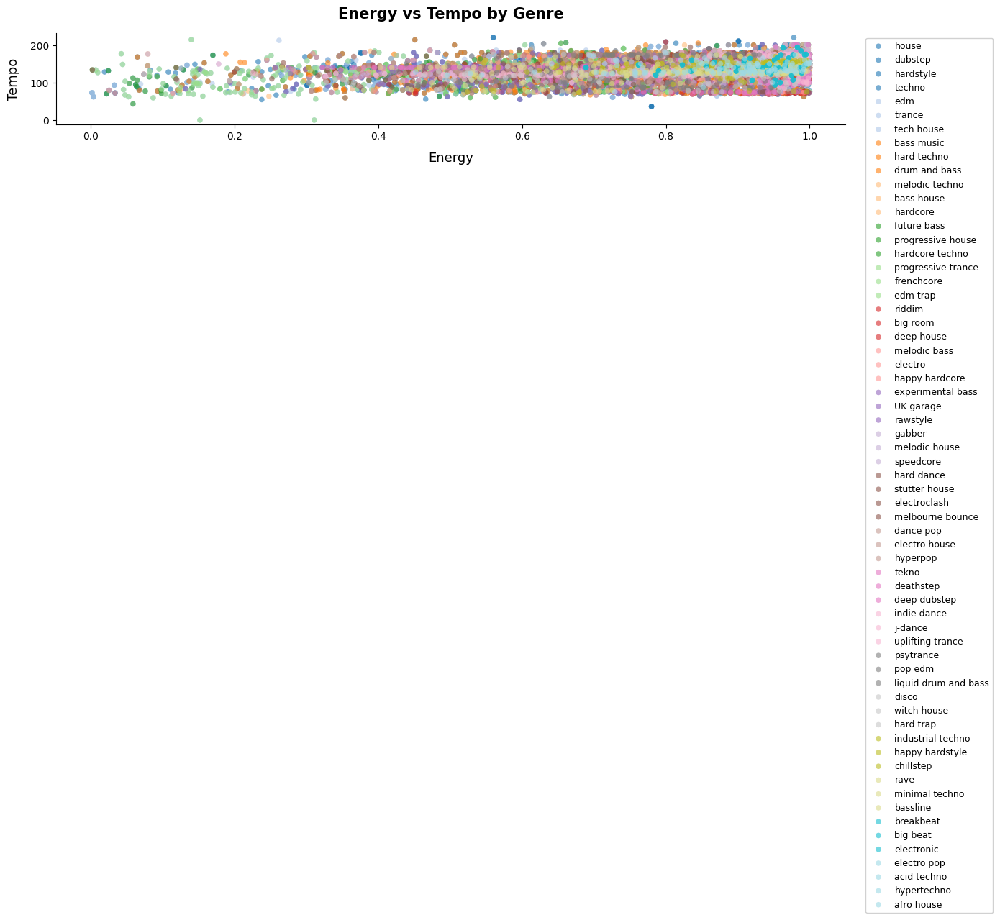

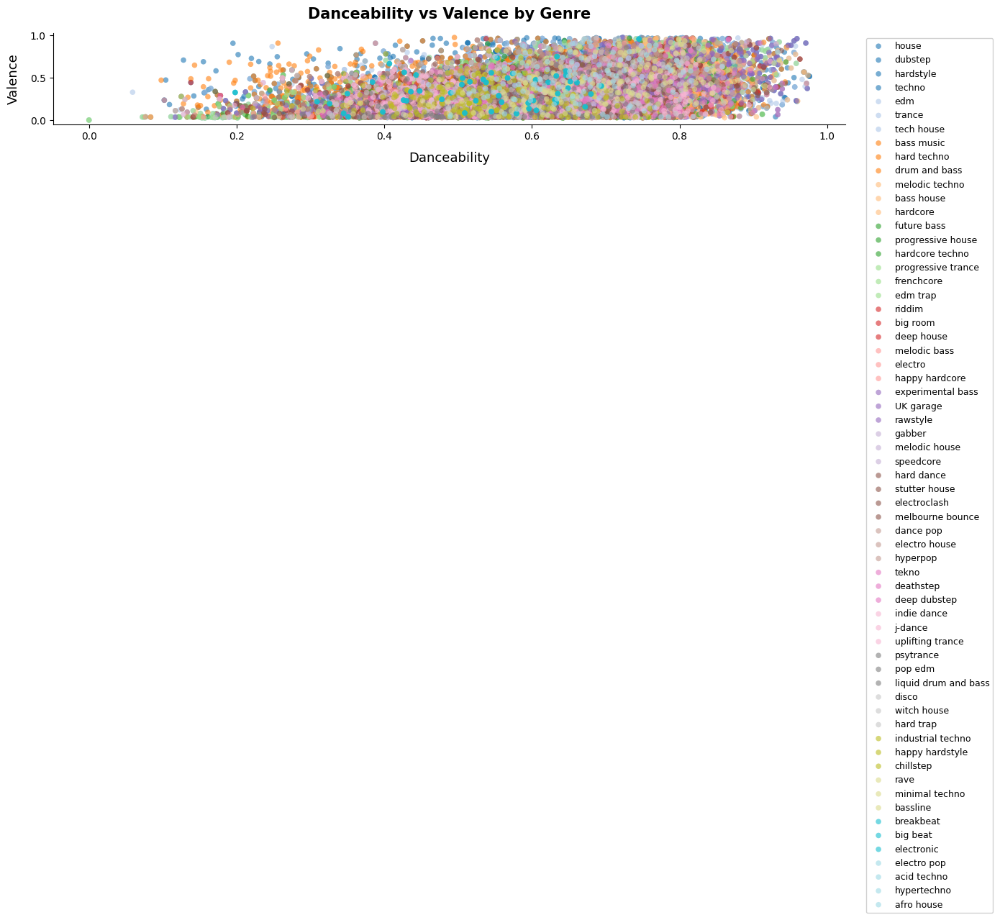

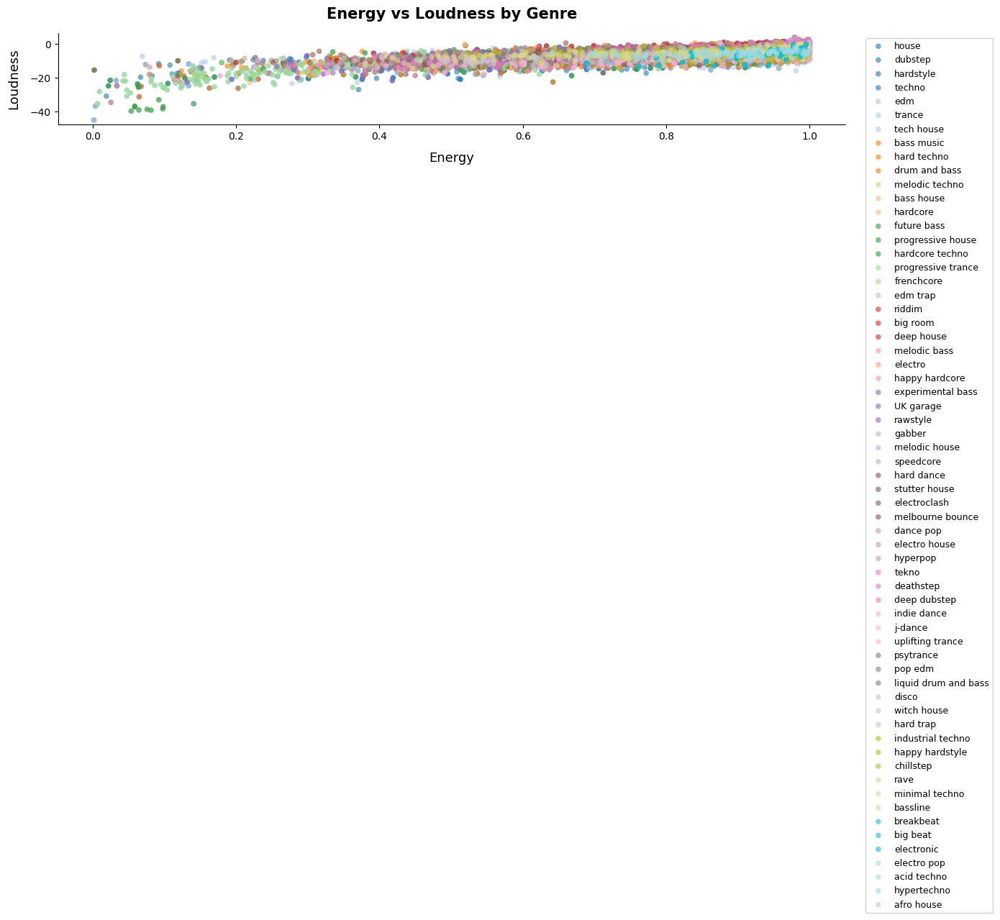

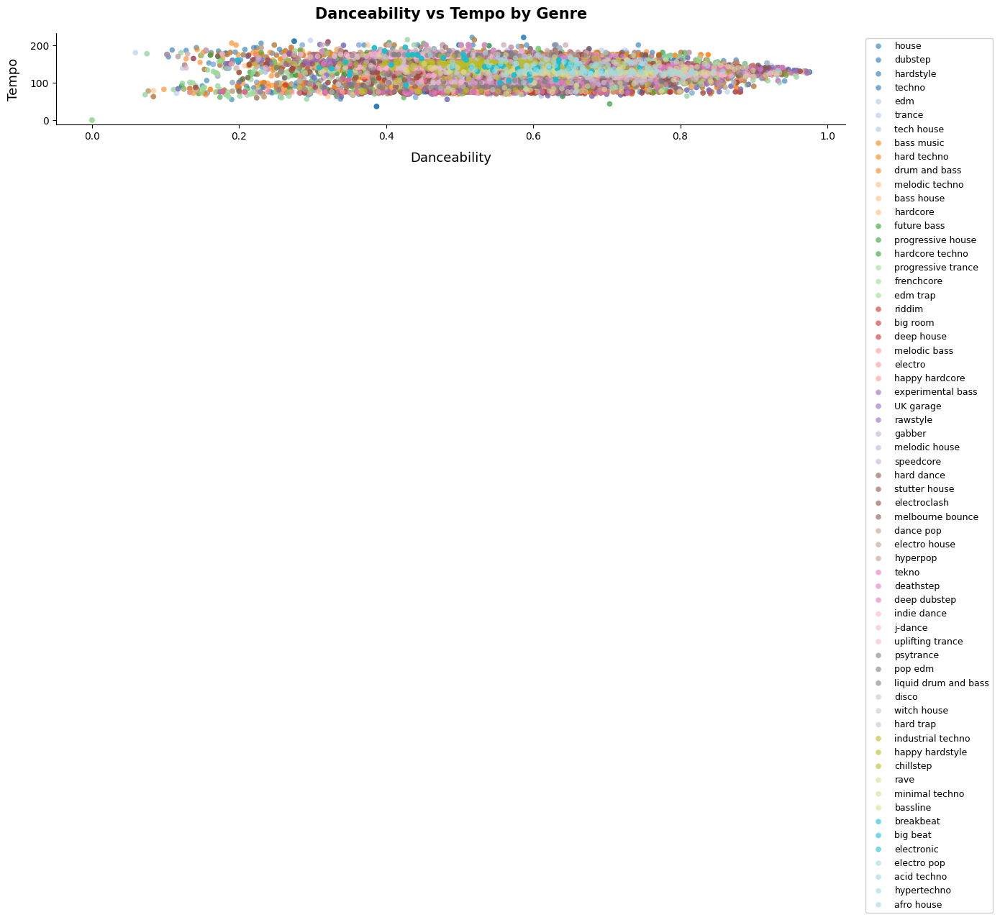

In [9]:
feature_pairs = [
    ("energy", "tempo"),
    ("danceability", "valence"),
    ("energy", "loudness"),
    ("danceability", "tempo"),
]

unique_genres = edm_exploded["genre"].value_counts().index.tolist()
cmap = plt.cm.get_cmap("tab20", len(unique_genres))
genre_colors = {g: cmap(i) for i, g in enumerate(unique_genres)}

for x_feat, y_feat in feature_pairs:
    fig, ax = plt.subplots(figsize=(14, 8))

    for genre in unique_genres:
        subset = edm_exploded[edm_exploded["genre"] == genre]
        ax.scatter(subset[x_feat], subset[y_feat], label=genre,
                   color=genre_colors[genre], alpha=0.6, s=30, edgecolors="none")

    ax.set_xlabel(x_feat.title(), fontsize=13, labelpad=10)
    ax.set_ylabel(y_feat.title(), fontsize=13, labelpad=10)
    ax.set_title(f"{x_feat.title()} vs {y_feat.title()} by Genre", fontsize=15, fontweight="bold", pad=15)
    ax.spines["top"].set_visible(False)
    ax.spines["right"].set_visible(False)
    ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left", fontsize=9, framealpha=0.9)
    ax.tick_params(labelsize=10)

    plt.tight_layout()
    plt.show()

### PCA 2D Projection

Reduces all audio features down to two principal components and plots every track colored by genre. This is the most direct preview of whether unsupervised clustering will work. If genres naturally form distinct groups in the reduced 2D space, a clustering algorithm should be able to recover those boundaries. If genres heavily overlap, it suggests either the features aren't sufficient or the genre labels themselves are fuzzy.

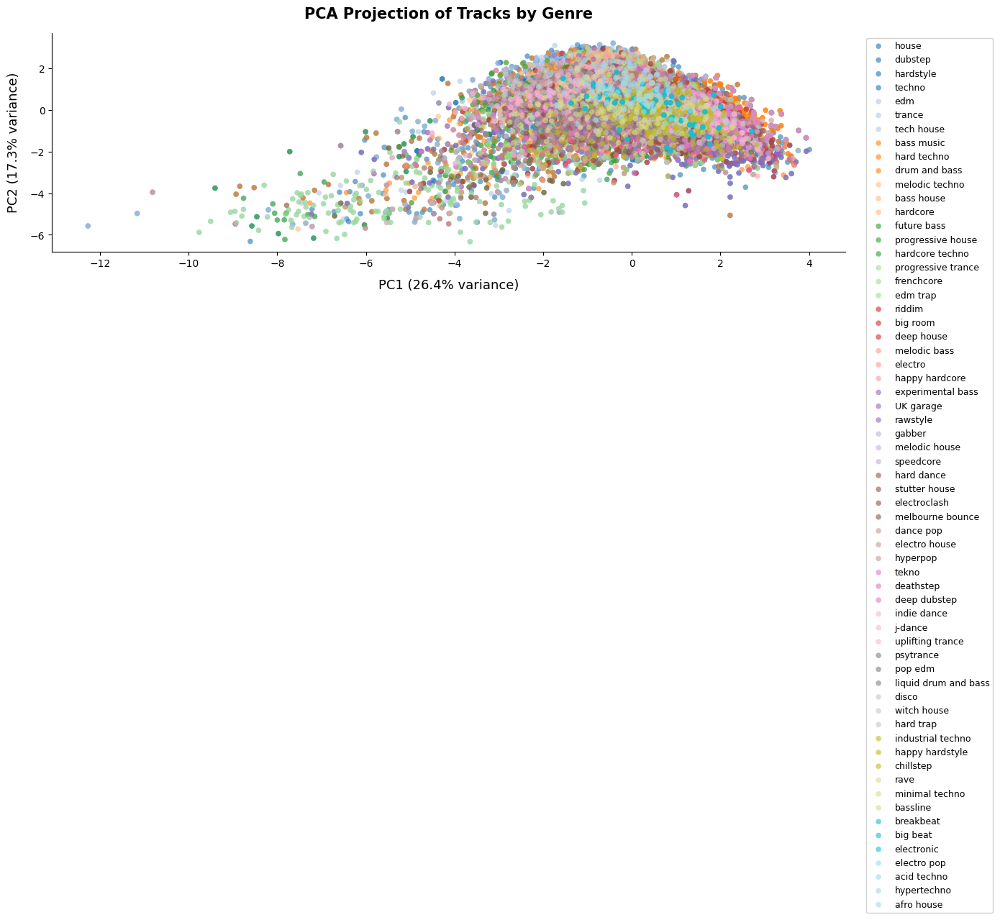

In [10]:
from sklearn.decomposition import PCA

audio_features = ["danceability", "energy", "loudness", "speechiness",
                  "acousticness", "instrumentalness", "liveness", "valence", "tempo"]

X = edm_exploded[audio_features].values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

fig, ax = plt.subplots(figsize=(14, 9))

for genre in unique_genres:
    mask = edm_exploded["genre"].values == genre
    ax.scatter(X_pca[mask, 0], X_pca[mask, 1], label=genre,
               color=genre_colors[genre], alpha=0.6, s=30, edgecolors="none")

ax.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.1%} variance)", fontsize=13, labelpad=10)
ax.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.1%} variance)", fontsize=13, labelpad=10)
ax.set_title("PCA Projection of Tracks by Genre", fontsize=15, fontweight="bold", pad=15)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.legend(bbox_to_anchor=(1.02, 1), loc="upper left", fontsize=9, framealpha=0.9)
ax.tick_params(labelsize=10)

plt.tight_layout()
plt.show()

### Feature Variance by Genre

Shows the standard deviation of each audio feature within each genre. Low variance means a genre is tightly defined for that feature (e.g. hardstyle tracks all have similar tempo), making it easy to classify. High variance means a genre is loosely defined for that feature, which will make it harder for a clustering model to use. This helps us understand which genres have clear, quantifiable identities and which are more amorphous.

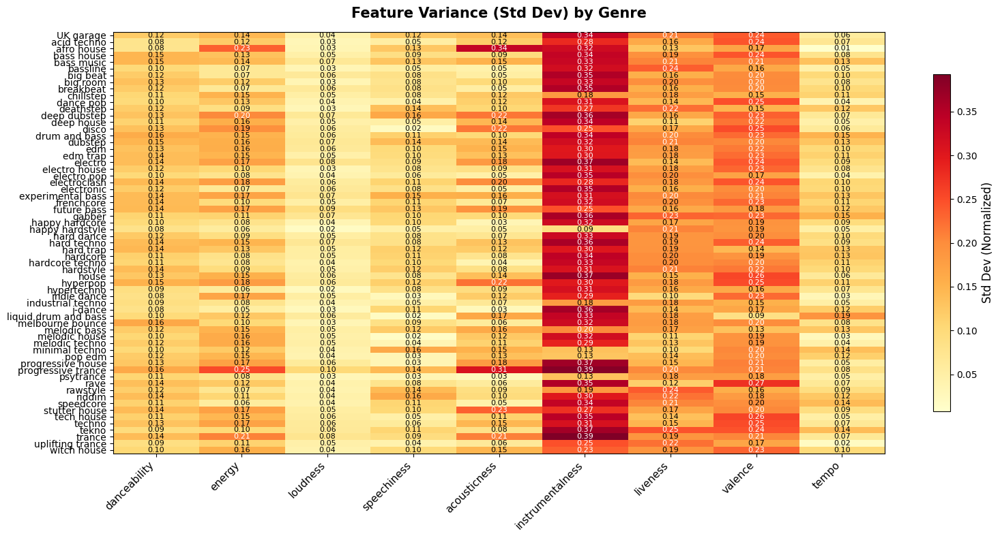

In [11]:
audio_features = ["danceability", "energy", "loudness", "speechiness",
                  "acousticness", "instrumentalness", "liveness", "valence", "tempo"]

# Normalize features to 0-1 so variance is comparable across features
scaler = MinMaxScaler()
edm_exploded_norm = edm_exploded.copy()
edm_exploded_norm[audio_features] = scaler.fit_transform(edm_exploded[audio_features])

genre_std = edm_exploded_norm.groupby("genre")[audio_features].std()

fig, ax = plt.subplots(figsize=(16, 8))
im = ax.imshow(genre_std.values, cmap="YlOrRd", aspect="auto")

ax.set_xticks(range(len(audio_features)))
ax.set_yticks(range(len(genre_std.index)))
ax.set_xticklabels(audio_features, rotation=45, ha="right", fontsize=11)
ax.set_yticklabels(genre_std.index, fontsize=10)

for i in range(len(genre_std.index)):
    for j in range(len(audio_features)):
        val = genre_std.iloc[i, j]
        ax.text(j, i, f"{val:.2f}", ha="center", va="center",
                fontsize=8, color="white" if val > 0.2 else "black")

cbar = fig.colorbar(im, ax=ax, shrink=0.8)
cbar.set_label("Std Dev (Normalized)", fontsize=12)
ax.set_title("Feature Variance (Std Dev) by Genre", fontsize=15, fontweight="bold", pad=15)

plt.tight_layout()
plt.show()

## Pre-Training Steps

### Step 1: Feature Selection

Distance-based clustering algorithms (K-Means, DBSCAN) treat every feature equally when computing distances between points. Including noisy or irrelevant features dilutes the signal from strong discriminators like tempo and energy. We also want to avoid highly correlated feature pairs (e.g. energy and loudness) since they effectively double-count the same information. Here we analyze which features provide the most independent, discriminative signal for separating subgenres based on variance across genres and inter-feature correlation.

In [12]:
# Dynamically get all numerical features from edm
all_features = edm.select_dtypes(include=np.number).columns.tolist()

# 1. Variance of genre means: features where genres differ the most (after normalization)
scaler = MinMaxScaler()
genre_means = edm_exploded.groupby("genre")[all_features].mean()
genre_means_scaled = pd.DataFrame(
    scaler.fit_transform(genre_means), index=genre_means.index, columns=genre_means.columns
)
between_genre_variance = genre_means_scaled.var().sort_values(ascending=False)

print("=== Between-Genre Variance (higher = more discriminative) ===")
print(between_genre_variance.to_string())

# 2. Correlation pairs above 0.5
print("\n=== Highly Correlated Feature Pairs (|r| > 0.5) ===")
corr = edm[all_features].corr()
for i in range(len(all_features)):
    for j in range(i + 1, len(all_features)):
        if abs(corr.iloc[i, j]) > 0.5:
            print(f"  {all_features[i]} <-> {all_features[j]}: {corr.iloc[i, j]:.3f}")

# 3. Drop noisy, redundant, and categorical features (only drop if they exist)
drop_features = ["loudness", "acousticness", "liveness", "key", "mode"]
existing_drops = [f for f in drop_features if f in edm.columns]
if existing_drops:
    edm = edm.drop(columns=existing_drops)
    print(f"\n=== Dropped Features ===")
    print(f"  {existing_drops}")
    print(f"  - loudness: highly correlated with energy (redundant)")
    print(f"  - acousticness: highly correlated with energy (redundant)")
    print(f"  - liveness: low between-genre variance (not discriminative)")
    print(f"  - key: categorical, not meaningful for distance-based clustering")
    print(f"  - mode: binary categorical, limited signal")
else:
    print("\n=== No features to drop (already removed) ===")

remaining_features = edm.select_dtypes(include=np.number).columns.tolist()
print(f"\n=== Remaining Numerical Features ===")
print(f"  {remaining_features}")
print(f"\nColumns in edm: {edm.columns.tolist()}")

=== Between-Genre Variance (higher = more discriminative) ===
energy              0.067615
instrumentalness    0.066220
danceability        0.064858
tempo               0.063359
speechiness         0.061467
liveness            0.053498
loudness            0.048724
acousticness        0.048256
key                 0.045232
mode                0.042757
valence             0.033958

=== Highly Correlated Feature Pairs (|r| > 0.5) ===
  energy <-> loudness: 0.649
  energy <-> acousticness: -0.518

=== Dropped Features ===
  ['loudness', 'acousticness', 'liveness', 'key', 'mode']
  - loudness: highly correlated with energy (redundant)
  - acousticness: highly correlated with energy (redundant)
  - liveness: low between-genre variance (not discriminative)
  - key: categorical, not meaningful for distance-based clustering
  - mode: binary categorical, limited signal

=== Remaining Numerical Features ===
  ['danceability', 'energy', 'speechiness', 'instrumentalness', 'valence', 'tempo']

Column

### Step 2: Training Data

For clustering, each track should appear exactly once. The `edm_exploded` DataFrame duplicates tracks across genres (a track labeled "dubstep, riddim" appears twice), which would bias the clustering algorithm toward multi-labeled artists. We'll use the original `edm` DataFrame as the training input so the model sees each track once and discovers clusters based purely on audio features without label influence.

In [13]:
print(f"edm_exploded shape (duplicated): {edm_exploded.shape}")
print(f"edm shape (deduplicated):       {edm.shape}")
print(f"\nDifference: {edm_exploded.shape[0] - edm.shape[0]} duplicate rows avoided")
print(f"\nUsing `edm` as training data — each track appears exactly once.")

edm_exploded shape (duplicated): (34720, 17)
edm shape (deduplicated):       (18509, 11)

Difference: 16211 duplicate rows avoided

Using `edm` as training data — each track appears exactly once.


### Step 3: Optimal Cluster Count

Choosing the right number of clusters (k) is critical. Too few clusters will lump distinct subgenres together; too many will fragment coherent genres into noise. The **elbow method** plots inertia (within-cluster sum of squares) against k — we look for the "elbow" where adding more clusters stops significantly reducing inertia. The **silhouette score** measures how well-separated clusters are on a scale from -1 to 1, where higher is better. Together these help us pick a k that reflects natural groupings in the data rather than forcing an arbitrary number.

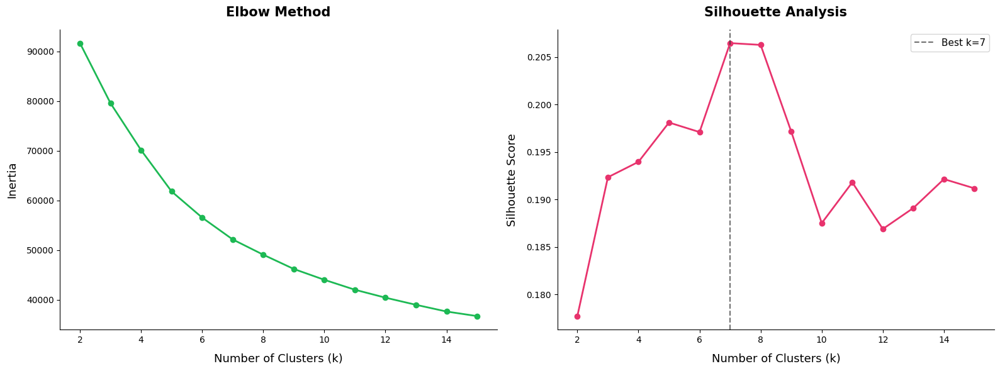


Features used: ['danceability', 'energy', 'speechiness', 'instrumentalness', 'valence', 'tempo']
Best silhouette score: 0.206 at k=7


In [14]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

audio_features = edm.select_dtypes(include=np.number).columns.tolist()

X = edm[audio_features].dropna().values
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

k_range = range(2, 16)
inertias = []
silhouette_scores = []

for k in k_range:
    km = KMeans(n_clusters=k, n_init=10, random_state=42)
    labels = km.fit_predict(X_scaled)
    inertias.append(km.inertia_)
    silhouette_scores.append(silhouette_score(X_scaled, labels))

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Elbow plot
ax1.plot(k_range, inertias, "o-", color="#1db954", linewidth=2, markersize=6)
ax1.set_xlabel("Number of Clusters (k)", fontsize=13, labelpad=10)
ax1.set_ylabel("Inertia", fontsize=13, labelpad=10)
ax1.set_title("Elbow Method", fontsize=15, fontweight="bold", pad=15)
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.tick_params(labelsize=10)

# Silhouette plot
ax2.plot(k_range, silhouette_scores, "o-", color="#e8336d", linewidth=2, markersize=6)
ax2.set_xlabel("Number of Clusters (k)", fontsize=13, labelpad=10)
ax2.set_ylabel("Silhouette Score", fontsize=13, labelpad=10)
ax2.set_title("Silhouette Analysis", fontsize=15, fontweight="bold", pad=15)
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.tick_params(labelsize=10)

best_k = list(k_range)[np.argmax(silhouette_scores)]
ax2.axvline(x=best_k, color="#333333", linestyle="--", alpha=0.7, label=f"Best k={best_k}")
ax2.legend(fontsize=11)

plt.tight_layout()
plt.show()

print(f"\nFeatures used: {audio_features}")
print(f"Best silhouette score: {max(silhouette_scores):.3f} at k={best_k}")

### Step 4: Genre Consolidation

With 25+ granular subgenre labels, many have very few artists and overlap significantly. For example, "hardcore techno", "frenchcore", "gabber", and "speedcore" are all branches of the same hardcore family. Consolidating these into broader genre families reduces label noise and gives the clustering model cleaner groupings to validate against. This doesn't affect the audio features — it only simplifies the labels we use to interpret the clusters after training.

In [15]:
genre_consolidation = {
    # Hardcore family
    "hardcore techno": "hardcore",
    "frenchcore": "hardcore",
    "gabber": "hardcore",
    "speedcore": "hardcore",
    "happy hardcore": "hardcore",
    "hardcore": "hardcore",
    # Hardstyle stays distinct — different tempo/feel from hardcore
    "hardstyle": "hardstyle",
    # Techno family
    "techno": "techno",
    "hard techno": "techno",
    "acid techno": "techno",
    "hypertechno": "techno",
    "tekno": "techno",
    # Bass music family
    "dubstep": "bass music",
    "riddim": "bass music",
    "deathstep": "bass music",
    "bass music": "bass music",
    "melodic bass": "bass music",
    "chillstep": "bass music",
    # Bass house / house family
    "bass house": "house",
    "bassline": "house",
    "stutter house": "house",
    "melbourne bounce": "house",
    "big room": "house",
    # Trap
    "edm trap": "trap",
    # Future bass
    "future bass": "future bass",
    # Electronic / pop-electronic
    "edm": "edm",
    "hyperpop": "hyperpop",
    "electroclash": "electroclash",
    "witch house": "witch house",
    # Other
    "j-dance": "hardcore",
}

def consolidate_genres(genre_str):
    if pd.isna(genre_str) or genre_str == "N/A":
        return genre_str
    genres = [g.strip() for g in genre_str.split(",")]
    consolidated = list(dict.fromkeys(genre_consolidation.get(g, g) for g in genres))
    return ", ".join(consolidated)

edm["genres_consolidated"] = edm["genres"].apply(consolidate_genres)

# Show before/after
print("=== Genre Consolidation Mapping ===")
before_after = edm[["artist_name", "genres", "genres_consolidated"]].drop_duplicates(subset="artist_name")
for _, row in before_after.iterrows():
    if row["genres"] != row["genres_consolidated"] and pd.notna(row["genres"]):
        print(f"  {row['artist_name']}: {row['genres']}  ->  {row['genres_consolidated']}")

# Count consolidated genres
consolidated_counts = (
    edm["genres_consolidated"]
    .dropna()
    .loc[edm["genres_consolidated"] != "N/A"]
    .str.split(", ")
    .explode()
    .str.strip()
    .value_counts()
)
print(f"\n=== Consolidated Genre Counts ({len(consolidated_counts)} genres) ===")
print(consolidated_counts.to_string())

=== Genre Consolidation Mapping ===
  adventure club: melodic bass, dubstep, edm, chillstep, future bass  ->  bass music, edm, future bass
  Ahee: dubstep, bass music  ->  bass music
  alison wonderland: edm trap, future bass, edm  ->  trap, future bass, edm
  ALLEYCVT: dubstep, edm, riddim  ->  bass music, edm
  angrybaby: stutter house  ->  house
  ATLiens: dubstep, edm trap, bass music  ->  bass music, trap
  avello: melodic bass  ->  bass music
  Bad Boombox: house, bass house  ->  house
  Baugruppe90: techno, hard techno  ->  techno
  Black Tiger Sex Machine: dubstep, electro, bass music  ->  bass music, electro
  Boogie T: dubstep, bass music  ->  bass music
  brutalismus 3000: techno, hard techno, tekno, gabber, acid techno  ->  techno, hardcore
  Bullet Tooth: dubstep, riddim  ->  bass music
  BUNT.: stutter house  ->  house
  Charlotte de Witte: techno, hard techno  ->  techno
  CHEEKS: stutter house  ->  house
  Chris Lorenzo: bass house, tech house  ->  house, tech house
  C

### Step 5: Outlier Detection

Outlier tracks with extreme feature values can distort cluster centroids and pull decision boundaries away from where they should be. In the PCA projection, outliers can spread the plot out and compress the meaningful structure into a small area. Identifying these tracks helps us understand if they're genuinely unusual songs (e.g. intros, interludes, spoken word tracks) or data quality issues. We flag them here using the IQR method across all audio features.

In [16]:
audio_features = edm.select_dtypes(include=np.number).columns.tolist()

# Flag outliers using IQR method (1.5x IQR beyond Q1/Q3)
outlier_mask = pd.Series(False, index=edm.index)
outlier_details = []

for feature in audio_features:
    Q1 = edm[feature].quantile(0.25)
    Q3 = edm[feature].quantile(0.75)
    IQR = Q3 - Q1
    lower = Q1 - 1.5 * IQR
    upper = Q3 + 1.5 * IQR
    feat_outliers = (edm[feature] < lower) | (edm[feature] > upper)
    
    for idx in edm[feat_outliers].index:
        outlier_details.append({
            "track_name": edm.loc[idx, "track_name"],
            "artist_name": edm.loc[idx, "artist_name"],
            "feature": feature,
            "value": edm.loc[idx, feature],
            "range": f"[{lower:.3f}, {upper:.3f}]"
        })
    outlier_mask |= feat_outliers

outlier_df = pd.DataFrame(outlier_details)
outlier_tracks = edm[outlier_mask][["track_name", "artist_name"]].drop_duplicates()

print(f"Total tracks: {len(edm)}")
print(f"Outlier tracks: {len(outlier_tracks)} ({len(outlier_tracks)/len(edm)*100:.1f}%)")
print(f"Features checked: {audio_features}")
print(f"\n=== Outlier Tracks ===")
for _, row in outlier_tracks.iterrows():
    reasons = outlier_df[
        (outlier_df["track_name"] == row["track_name"]) &
        (outlier_df["artist_name"] == row["artist_name"])
    ]
    reason_strs = [f"{r['feature']}={r['value']:.3f}" for _, r in reasons.iterrows()]
    print(f"  {row['artist_name']} - {row['track_name']}  ({', '.join(reason_strs)})")

Total tracks: 18509
Outlier tracks: 3647 (19.7%)
Features checked: ['danceability', 'energy', 'speechiness', 'instrumentalness', 'valence', 'tempo']

=== Outlier Tracks ===
  1991 - On  (danceability=0.187, energy=0.252)
  1991 - Reloaded  (danceability=0.145, tempo=63.996)
  1991 - Life  (speechiness=0.227)
  1991 - We All Need Someone  (danceability=0.205, speechiness=0.360)
  1991 - Heartstrings  (danceability=0.185)
  999999999 - Kick It  (speechiness=0.218)
  Abana - Sativa Jazz - Extended Mix  (speechiness=0.211)
  Above & Beyond - Shall We Begin - Mixed  (energy=0.228)
  Above & Beyond - Second Chance - Mixed  (energy=0.162)
  Above & Beyond - Ghosts [Strings] - Mixed  (energy=0.435)
  Above & Beyond - Machine Keys - Cephas Azariah Revisit (Mixed)  (energy=0.082)
  Above & Beyond - holding on like it's the last time - Mixed  (energy=0.313, tempo=56.019)
  Above & Beyond - Joy Paradox - Mixed  (energy=0.201, tempo=74.876)
  Above & Beyond - Afterlife - Mixed  (danceability=0.174,

In [17]:
edm.head()

,track_name,track_id,artist_name,album_name,danceability,energy,speechiness,instrumentalness,valence,tempo,genres,genres_consolidated
0,On,4auxa3dOFI2A9NXoLlKt1c,1991,Odyssey,0.187,0.252,0.0419,0.507,0.580,131.975,NaN,NaN
1,Odyssey,50p5HLJgHhbIZX1n0WD7N2,1991,Odyssey,0.459,0.910,0.0478,0.896,0.312,173.953,NaN,NaN
2,Reloaded,2K8RNtp5JXglnBvkeCgaMN,1991,Odyssey,0.145,0.972,0.1280,0.210,0.554,63.996,NaN,NaN
3,Out Of My Head,6Q2tJt4oYeC6bbytXc5Z0R,1991,Odyssey,0.473,0.947,0.0772,0.788,0.331,173.998,NaN,NaN
4,Nothing Left To Lose,2UFTFZoIZg9WMspos6xiX9,1991,Odyssey,0.275,0.973,0.0672,0.750,0.137,115.089,NaN,NaN


## Data Preparation Pipeline

Replaces the manual pre-training steps above (feature selection, genre consolidation, outlier removal, scaling) with a single pipeline call. This produces a training-ready dataset from raw CSVs in one step.

In [ ]:
import sys
sys.path.insert(0, "..")
from preprocessing.pipeline import prepare_training_data

result = prepare_training_data(data_dir="../data/raw")

X = result["X"]
df = result["df"]
scaler = result["scaler"]
audio_features = result["audio_features"]

print(f"\nX shape: {X.shape}")
print(f"df shape: {df.shape}")
print(f"Audio features: {audio_features}")
print(f"Columns: {result['feature_names']}")

## K-Means Clustering

In [ ]:
from model_training.train import find_optimal_k

optimal = find_optimal_k(X)

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))

# Elbow plot
ax1.plot(optimal["k_range"], optimal["inertias"], "o-", color="#1db954", linewidth=2, markersize=6)
ax1.set_xlabel("Number of Clusters (k)", fontsize=13, labelpad=10)
ax1.set_ylabel("Inertia", fontsize=13, labelpad=10)
ax1.set_title("Elbow Method", fontsize=15, fontweight="bold", pad=15)
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.tick_params(labelsize=10)

# Silhouette plot
ax2.plot(optimal["k_range"], optimal["silhouettes"], "o-", color="#e8336d", linewidth=2, markersize=6)
ax2.set_xlabel("Number of Clusters (k)", fontsize=13, labelpad=10)
ax2.set_ylabel("Silhouette Score", fontsize=13, labelpad=10)
ax2.set_title("Silhouette Analysis", fontsize=15, fontweight="bold", pad=15)
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.tick_params(labelsize=10)
ax2.axvline(x=optimal["best_k"], color="#333333", linestyle="--", alpha=0.7,
            label=f"Best k={optimal['best_k']}")
ax2.legend(fontsize=11)

plt.tight_layout()
plt.show()

print(f"Best silhouette score: {optimal['best_score']:.3f} at k={optimal['best_k']}")

In [ ]:
from model_training.train import compare_k_values

# Compare best_k with 6, 10, 15 (deduplicated)
k_values = sorted(set([optimal["best_k"], 6, 10, 15]))
results = compare_k_values(X, k_values, df, audio_features, scaler)

# Summary comparison table
summary = pd.DataFrame([{
    "k": r["k"],
    "Silhouette": f"{r['silhouette']:.3f}",
    "ARI": f"{r['ari']:.3f}",
    "NMI": f"{r['nmi']:.3f}",
} for r in results])
print(summary.to_string(index=False))

### Cluster-Genre Alignment

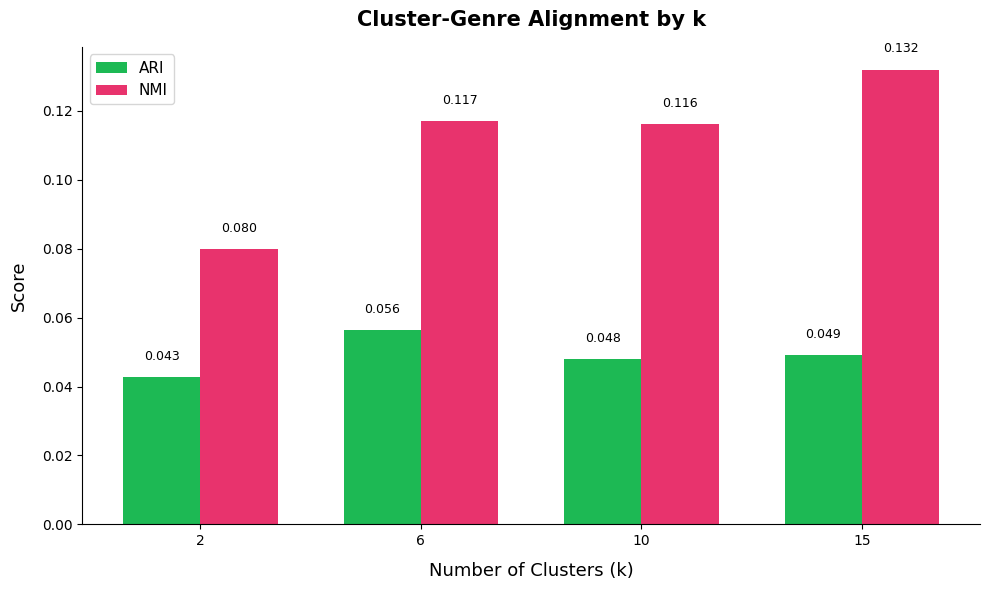

In [21]:
# ARI/NMI bar chart comparing k values
ks = [r["k"] for r in results]
aris = [r["ari"] for r in results]
nmis = [r["nmi"] for r in results]

x = np.arange(len(ks))
width = 0.35

fig, ax = plt.subplots(figsize=(10, 6))
ax.bar(x - width / 2, aris, width, label="ARI", color="#1db954")
ax.bar(x + width / 2, nmis, width, label="NMI", color="#e8336d")

ax.set_xlabel("Number of Clusters (k)", fontsize=13, labelpad=10)
ax.set_ylabel("Score", fontsize=13, labelpad=10)
ax.set_title("Cluster-Genre Alignment by k", fontsize=15, fontweight="bold", pad=15)
ax.set_xticks(x)
ax.set_xticklabels(ks)
ax.legend(fontsize=11)
ax.spines["top"].set_visible(False)
ax.spines["right"].set_visible(False)
ax.tick_params(labelsize=10)

for i, (ari, nmi) in enumerate(zip(aris, nmis)):
    ax.text(i - width / 2, ari + 0.005, f"{ari:.3f}", ha="center", fontsize=9)
    ax.text(i + width / 2, nmi + 0.005, f"{nmi:.3f}", ha="center", fontsize=9)

plt.tight_layout()
plt.show()

### Genre-Cluster Heatmap

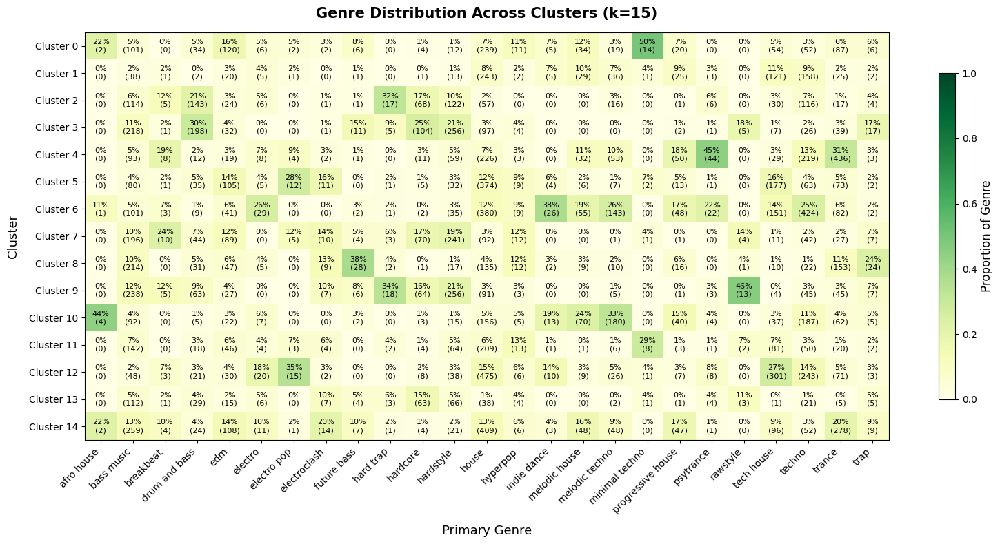

In [22]:
# Cross-tab heatmap for highest-NMI result, column-normalized
best_result = max(results, key=lambda r: r["nmi"])
ct = best_result["crosstab"]

# Normalize by column (genre) — shows what % of each genre lands in each cluster
ct_norm = ct.div(ct.sum(axis=0), axis=1)

fig, ax = plt.subplots(figsize=(16, 8))
im = ax.imshow(ct_norm.values, cmap="YlGn", aspect="auto", vmin=0, vmax=1)

ax.set_xticks(range(len(ct_norm.columns)))
ax.set_yticks(range(len(ct_norm.index)))
ax.set_xticklabels(ct_norm.columns, rotation=45, ha="right", fontsize=10)
ax.set_yticklabels([f"Cluster {c}" for c in ct_norm.index], fontsize=10)

for i in range(len(ct_norm.index)):
    for j in range(len(ct_norm.columns)):
        val = ct_norm.iloc[i, j]
        count = ct.iloc[i, j]
        ax.text(j, i, f"{val:.0%}\n({count})", ha="center", va="center",
                fontsize=8, color="white" if val > 0.5 else "black")

cbar = fig.colorbar(im, ax=ax, shrink=0.8)
cbar.set_label("Proportion of Genre", fontsize=12)
ax.set_xlabel("Primary Genre", fontsize=13, labelpad=10)
ax.set_ylabel("Cluster", fontsize=13, labelpad=10)
ax.set_title(f"Genre Distribution Across Clusters (k={best_result['k']})",
             fontsize=15, fontweight="bold", pad=15)

plt.tight_layout()
plt.show()

### Cluster Profiles

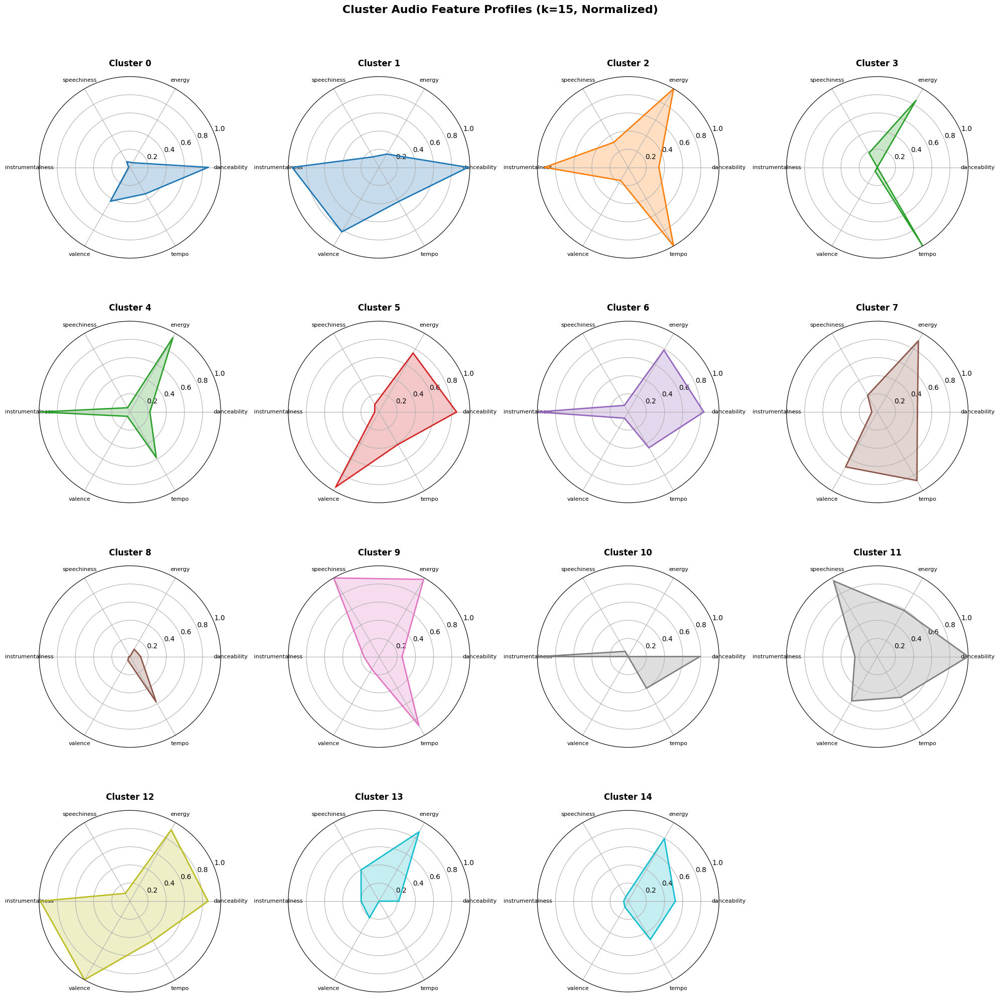


Cluster Centroids (original units, k=15):
         danceability  energy  speechiness  instrumentalness  valence    tempo
cluster                                                                       
0               0.732   0.641        0.056             0.075    0.404  122.010
1               0.771   0.676        0.062             0.766    0.604  127.438
2               0.560   0.941        0.083             0.740    0.269  159.161
3               0.449   0.893        0.068             0.064    0.208  158.971
4               0.521   0.924        0.053             0.790    0.212  135.624
5               0.730   0.861        0.058             0.099    0.673  126.320
6               0.723   0.873        0.057             0.798    0.224  128.633
7               0.594   0.911        0.071             0.108    0.541  152.025
8               0.487   0.652        0.047             0.073    0.207  135.407
9               0.532   0.935        0.160             0.187    0.266  152.289
10       

In [23]:
from sklearn.preprocessing import MinMaxScaler

profiles = best_result["profiles"]
k = best_result["k"]

# Normalize profiles to 0-1 for radar comparison
radar_scaler = MinMaxScaler()
profiles_norm = pd.DataFrame(
    radar_scaler.fit_transform(profiles),
    index=profiles.index,
    columns=profiles.columns,
)

n_features = len(audio_features)
angles = np.linspace(0, 2 * np.pi, n_features, endpoint=False).tolist()
angles += angles[:1]

cols = 4
rows = (k + cols - 1) // cols
fig, axes = plt.subplots(rows, cols, figsize=(20, 5 * rows), subplot_kw=dict(polar=True))
axes = axes.flatten() if k > cols else ([axes] if k == 1 else axes.flatten())

cmap = plt.colormaps["tab10"].resampled(k)
for i in range(k):
    ax = axes[i]
    values = profiles_norm.loc[i].tolist()
    values += values[:1]
    color = cmap(i)

    ax.fill(angles, values, color=color, alpha=0.25)
    ax.plot(angles, values, color=color, linewidth=2)
    ax.set_xticks(angles[:-1])
    ax.set_xticklabels(audio_features, fontsize=8)
    ax.set_ylim(0, 1)
    ax.set_title(f"Cluster {i}", fontsize=12, fontweight="bold", pad=15)

for j in range(k, len(axes)):
    axes[j].set_visible(False)

fig.suptitle(f"Cluster Audio Feature Profiles (k={k}, Normalized)",
             fontsize=16, fontweight="bold", y=1.01)
plt.tight_layout()
plt.show()

# Raw centroid table
print(f"\nCluster Centroids (original units, k={k}):")
print(profiles.round(3).to_string())

### PCA Visualization by Cluster

In [ ]:
from model_training.train import reduce_pca, get_primary_genre

pca_result = reduce_pca(X)
X_pca = pca_result["X_pca"]
pca = pca_result["pca"]

primary_genres = get_primary_genre(df)
best_labels = best_result["labels"]

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))

# Left: colored by cluster
cmap_cluster = plt.colormaps["tab10"].resampled(best_result["k"])
for c in range(best_result["k"]):
    mask = best_labels == c
    ax1.scatter(X_pca[mask, 0], X_pca[mask, 1], label=f"Cluster {c}",
                color=cmap_cluster(c), alpha=0.5, s=20, edgecolors="none")
ax1.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.1%} variance)", fontsize=13, labelpad=10)
ax1.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.1%} variance)", fontsize=13, labelpad=10)
ax1.set_title(f"PCA by Cluster (k={best_result['k']})", fontsize=15, fontweight="bold", pad=15)
ax1.legend(fontsize=9, loc="upper left")
ax1.spines["top"].set_visible(False)
ax1.spines["right"].set_visible(False)
ax1.tick_params(labelsize=10)

# Right: colored by primary genre (top 10)
top_genres = primary_genres.value_counts().head(10).index.tolist()
cmap_genre = plt.colormaps["tab10"].resampled(len(top_genres))
genre_colors = {g: cmap_genre(i) for i, g in enumerate(top_genres)}

for genre in top_genres:
    mask = primary_genres.values == genre
    ax2.scatter(X_pca[mask, 0], X_pca[mask, 1], label=genre,
                color=genre_colors[genre], alpha=0.5, s=20, edgecolors="none")
# Plot remaining genres in gray
other_mask = ~primary_genres.isin(top_genres).values
if other_mask.any():
    ax2.scatter(X_pca[other_mask, 0], X_pca[other_mask, 1], label="other",
                color="#cccccc", alpha=0.3, s=15, edgecolors="none")

ax2.set_xlabel(f"PC1 ({pca.explained_variance_ratio_[0]:.1%} variance)", fontsize=13, labelpad=10)
ax2.set_ylabel(f"PC2 ({pca.explained_variance_ratio_[1]:.1%} variance)", fontsize=13, labelpad=10)
ax2.set_title("PCA by Primary Genre", fontsize=15, fontweight="bold", pad=15)
ax2.legend(fontsize=9, loc="upper left")
ax2.spines["top"].set_visible(False)
ax2.spines["right"].set_visible(False)
ax2.tick_params(labelsize=10)

plt.tight_layout()
plt.show()